In [20]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

In [21]:
# Parameters
L = 1.0 # String Length
c = 1.0 # Diffusion Constant
dt = 0.001 # Timestep
N = 100 # String Discretization
dx = L / N # Spatial Step
x = np.linspace(0, L, N+1) # Spatial Grid # Fix grid to include boundary condition

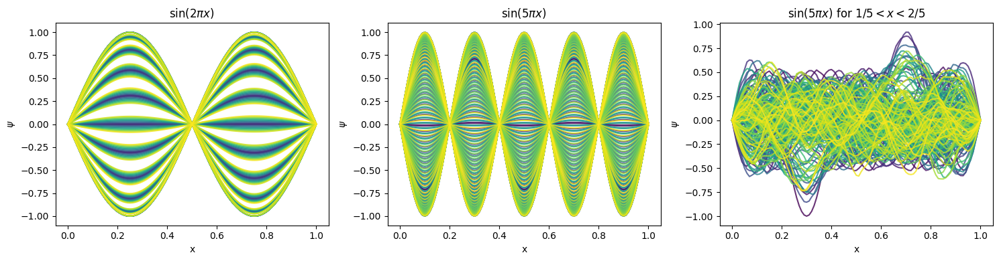

In [36]:
# sin(2*pi*x)
psi_present_i = np.sin(2*np.pi*x)
psi_past_n_i = np.copy(psi_present_i)
psi_new_i = np.zeros_like(psi_present_i)

# sin(5*pi*x)
psi_present_ii = np.sin(5*np.pi*x)
psi_past_n_ii = np.copy(psi_present_ii)
psi_new_ii = np.zeros_like(psi_present_ii)

# sin(5*pi*x) if 1/5<x<2/5, else Ψ=0
psi_present_iii = np.where((x > 1/5) & (x < 2/5), np.sin(5*np.pi*x), 0)
psi_past_n_iii = np.copy(psi_present_iii)
psi_new_iii = np.zeros_like(psi_present_iii)

# Create figure with 3 subplots
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
cmap = plt.cm.viridis

# Plot only every plot_every-th step so you see curves, not a solid filled region
plot_every = 450  # fewer curves = clearer; increase to 1000 for even fewer

# Time-stepping loop
time = np.arange(1, N, dt)
n_steps = len(time)

# Animation variables
frame_skip = 450
stored_i = []
stored_ii = []
stored_iii = []

for i, t in enumerate(time):
    # Get color based on time step
    color = cmap(i / n_steps)

    psi_new_i[1:-1] = 2 * psi_present_i[1:-1] - psi_past_n_i[1:-1] + (dt * c * N)**2 * ((-2 * psi_present_i[1:-1]) + psi_present_i[0:-2] + psi_present_i[2:])
    psi_past_n_i = np.copy(psi_present_i)
    psi_present_i = np.copy(psi_new_i)
    if i % plot_every == 0:
        axes[0].plot(x, psi_present_i, color=color, alpha=0.8)
    
    psi_new_ii[1:-1] = 2 * psi_present_ii[1:-1] - psi_past_n_ii[1:-1] + (dt * c * N)**2 * ((-2 * psi_present_ii[1:-1]) + psi_present_ii[0:-2] + psi_present_ii[2:])
    psi_past_n_ii = np.copy(psi_present_ii)
    psi_present_ii = np.copy(psi_new_ii)
    if i % plot_every == 0:
        axes[1].plot(x, psi_present_ii, color=color, alpha=0.8)

    psi_new_iii[1:-1] = 2 * psi_present_iii[1:-1] - psi_past_n_iii[1:-1] + (dt * c * N)**2 * ((-2 * psi_present_iii[1:-1]) + psi_present_iii[0:-2] + psi_present_iii[2:])
    psi_past_n_iii = np.copy(psi_present_iii)
    psi_present_iii = np.copy(psi_new_iii)
    if i % plot_every == 0:
        axes[2].plot(x, psi_present_iii, color=color, alpha=0.8)

    if i % frame_skip == 0:
        stored_i.append(psi_present_i.copy())
        stored_ii.append(psi_present_ii.copy())
        stored_iii.append(psi_present_iii.copy())

# Set titles and labels
axes[0].set_title(r'$\sin(2\pi x)$')
axes[0].set_xlabel('x')
axes[0].set_ylabel(r'$\psi$')

axes[1].set_title(r'$\sin(5\pi x)$')
axes[1].set_xlabel('x')
axes[1].set_ylabel(r'$\psi$')

axes[2].set_title(r'$\sin(5\pi x)$ for $1/5 < x < 2/5$')
axes[2].set_xlabel('x')
axes[2].set_ylabel(r'$\psi$')

plt.tight_layout()
plt.show()

In [40]:
# Animate: 3 subplots, one line each, update from stored lists
fig, axes = plt.subplots(1, 3, figsize=(14, 6))
axes[0].set_ylim(-1, 1)
axes[0].set_title(r'$\sin(2\pi x)$')
axes[0].set_xlabel('x')
axes[0].set_ylabel(r'$\psi_i^{n+1}$')
line_i, = axes[0].plot(x, stored_i[0], 'b-', lw=2)

axes[1].set_ylim(-1, 1)
axes[1].set_title(r'$\sin(5\pi x)$')
axes[1].set_xlabel('x')
axes[1].set_ylabel(r'$\psi_i^{n+1}$')
line_ii, = axes[1].plot(x, stored_ii[0], 'b-', lw=2)

axes[2].set_ylim(-1, 1)
axes[2].set_title(r'$\sin(5\pi x)$ for $1/5 < x < 2/5$')
axes[2].set_xlabel('x')
axes[2].set_ylabel(r'$\psi_i^{n+1}$')
line_iii, = axes[2].plot(x, stored_iii[0], 'b-', lw=2)
plt.close(fig)

def update(frame):
    line_i.set_ydata(stored_i[frame])
    line_ii.set_ydata(stored_ii[frame])
    line_iii.set_ydata(stored_iii[frame])
    return line_i, line_ii, line_iii

anim = animation.FuncAnimation(fig, update, frames=len(stored_i), interval=50, blit=True)
animation.embedded_limit = 200

from IPython.display import HTML
HTML(anim.to_jshtml())